In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.metrics import mean_squared_error
import joblib
from sklearn.model_selection import GridSearchCV, train_test_split
from scipy.spatial import distance
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
from sklearn.ensemble import RandomForestRegressor
import warnings

# Data behandling

## Load data

In [3]:
data = pd.read_csv('case1Data.txt', sep=',', skipinitialspace=True)
y_mean = data['y'].mean()
y_std = data['y'].std()
data_cat = data[['C_ 1', 'C_ 2', 'C_ 3', 'C_ 4', 'C_ 5']]
data_encoded = pd.get_dummies(data_cat).astype(int)
C1_dummy = pd.get_dummies(data['C_ 1'], dummy_na=True).astype(int)
NaN_col = C1_dummy.iloc[:, -1]
data_encoded.loc[NaN_col == 1, data_encoded.columns[:5]] = np.nan

In [4]:
data_norm = data.copy()
scaler = StandardScaler()
data_norm.iloc[:, :96] = scaler.fit_transform(data_norm.iloc[:, :96])
scaler_filename = 'scaler_KNNoptimize.pkl'
joblib.dump(scaler, scaler_filename)

data_tot = pd.DataFrame()
data_tot = pd.concat([data_norm.iloc[:,:96],data_encoded], axis=1)
data_tot.iloc[:, 93:].head()

,x_93,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,NaN,1.021911,1.103443,0.0,1.0,0.0,0.0,0.0,1,0,...,0,0,0,0,1,0,0,0,1,0
1,1.142396,0.923233,2.035764,0.0,0.0,0.0,0.0,1.0,1,0,...,1,0,0,0,0,1,0,0,0,0
2,0.077127,0.333162,-0.467096,0.0,0.0,1.0,0.0,0.0,1,1,...,0,1,0,0,0,1,0,0,0,0
3,0.778344,0.933975,1.279824,NaN,NaN,NaN,NaN,NaN,1,0,...,0,0,0,0,1,1,0,0,0,0
4,-0.336497,-0.275123,-1.253445,1.0,0.0,0.0,0.0,0.0,1,0,...,0,0,0,0,1,0,1,0,0,0


## KNN 

In [5]:
K = 1

### Data knn imputed 

In [6]:
knn_imputer = KNNImputer(n_neighbors=K) 
data_knn = pd.DataFrame(knn_imputer.fit_transform(data_tot), columns=data_tot.columns)
data_knn_imputed = data_knn.copy()
data_knn.iloc[:,94:].head()

,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,1.021911,1.103443,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.923233,2.035764,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.333162,-0.467096,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.933975,1.279824,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,-0.275123,-1.253445,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [7]:
def replace_max_value(row):
    maks_værdi = row.max()
    return row.apply(lambda x: 1 if np.abs(x) == maks_værdi else 0)

data_knn.iloc[:,96:101] = data_knn.iloc[:,96:101].apply(replace_max_value, axis=1)
data_knn.iloc[:,96:].head()

,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,C_ 3_I,C_ 3_J,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [8]:
scaler = joblib.load(scaler_filename)
data_knn = data_tot.copy()
data_knn.iloc[:, :96] = scaler.inverse_transform(data_knn.iloc[:, :96].values)
data_knn_imputed.iloc[:, :96] = scaler.inverse_transform(data_knn_imputed.iloc[:, :96].values)
data_knn.iloc[:, 94:].head()

,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,26.197445,-9.913837,0.0,1.0,0.0,0.0,0.0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1,25.924603,-7.015803,0.0,0.0,0.0,0.0,1.0,1,0,0,...,1,0,0,0,0,1,0,0,0,0
2,24.293073,-14.795709,0.0,0.0,1.0,0.0,0.0,1,1,0,...,0,1,0,0,0,1,0,0,0,0
3,25.954304,-9.365574,NaN,NaN,NaN,NaN,NaN,1,0,0,...,0,0,0,0,1,1,0,0,0,0
4,22.611184,-17.240003,1.0,0.0,0.0,0.0,0.0,1,0,1,...,0,0,0,0,1,0,1,0,0,0


In [9]:
data_knn_imputed.head()

,y,x_ 1,x_ 2,x_ 3,x_ 4,x_ 5,x_ 6,x_ 7,x_ 8,x_ 9,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,90.685036,24.062581,14.091650,-3.978178,-1.504027,-14.986790,0.651581,-37.878245,16.213807,-3.965437,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,60.844445,26.204958,11.185962,-8.247602,-3.875866,-11.329702,2.637900,-39.617497,16.996926,-2.442164,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,18.062345,18.560873,11.355342,-9.370161,-3.745315,-16.292421,-1.831774,-37.584605,14.411348,-2.376175,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-8.139839,31.896496,10.069040,-9.484426,-1.512786,-11.421909,-5.649180,-42.830037,18.403197,-7.791762,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,-4.994792,25.400286,16.134188,-3.600959,-2.615988,-15.455676,-4.950816,-39.932456,15.194819,-7.341165,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


### Comparison between K values


#### Function for knn

In [10]:
def knn_optimize(K_n, type_knn):
    knn_imputer = KNNImputer(n_neighbors=K_n, weights=type_knn) 
    data_imputed_def = pd.DataFrame()
    data_imputed_def = pd.DataFrame(knn_imputer.fit_transform(data_tot), columns=data_tot.columns)
    data_imputed_def.iloc[:,96:101] = data_imputed_def.iloc[:,96:101].apply(replace_max_value, axis=1)
    scaler = joblib.load(scaler_filename)
    data_knn_def = data_tot.copy()
    data_knn_def.iloc[:, :96] = scaler.inverse_transform(data_imputed_def.iloc[:, :96].values)
    data_knn_def.iloc[:, 96:] = data_imputed_def.iloc[:, 96:]
    return data_knn_def

data_check = knn_optimize(1, 'distance')
data_check.iloc[:, 94:].head()


,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,26.197445,-9.913837,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,25.924603,-7.015803,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,24.293073,-14.795709,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,25.954304,-9.365574,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,22.611184,-17.240003,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


#### Funktioner til at bestemem bedste værdi for K

In [11]:
from sklearn.neighbors import KernelDensity
from scipy.spatial.distance import jensenshannon
import numpy as np

def compute_jensen_shannon_divergence(vector1, vector2, kernel='gaussian', bandwidth=1.0, num_points=1000):

    vector1 = vector1[~np.isnan(vector1)]
    vector2 = vector2[~np.isnan(vector2)]
    
    vector1 = np.array(vector1)
    vector2 = np.array(vector2)
    
    kde1 = KernelDensity(kernel=kernel, bandwidth=bandwidth).fit(vector1[:, None])
    kde2 = KernelDensity(kernel=kernel, bandwidth=bandwidth).fit(vector2[:, None])

    min_val = min(min(vector1), min(vector2))
    max_val = max(max(vector1), max(vector2))
    eval_points = np.linspace(min_val, max_val, num_points)

    pdf1 = np.exp(kde1.score_samples(eval_points[:, None]))
    pdf2 = np.exp(kde2.score_samples(eval_points[:, None]))

    js_divergence = jensenshannon(pdf1, pdf2)

    return js_divergence

js_divergence = compute_jensen_shannon_divergence(data['y'], data_check['y'])
print("Jensen-Shannon Divergence:", js_divergence)


Jensen-Shannon Divergence: 2.2968393072627338e-09


In [12]:
def find_K(num_k, type):
    op_tab = np.zeros((num_k, 96))
    for K_l in range(1,num_k+1):
        data_optimize = knn_optimize(K_l, type)
        for i, col in enumerate(data.columns[:96]):
            j_value =  compute_jensen_shannon_divergence(data[col], data_optimize[col])
            op_tab[K_l - 1, i] = j_value
    return op_tab


In [13]:
num_k = 100
data_bad_uni  = np.zeros((num_k, 96))
data_good_knn = np.zeros((num_k, 96))
data_bad_dis  = np.zeros((num_k, 96))
data_good_dis = np.zeros((num_k, 96))
num_good_uni = 0
num_bad_uni = 0
num_good_dis = 0
num_bad_dis = 0

for type in ['uniform', 'distance']:
    if type == 'uniform':
        table_uni = find_K(num_k=num_k, type=type)
        num_good_uni = np.argmin(table_uni.mean(axis = 1)) + 1
        num_bad_uni = np.argmax(table_uni.mean(axis = 1)) + 1
        data_bad_uni = knn_optimize(num_bad_uni, type)
        data_good_uni = knn_optimize(num_good_uni, type)
    elif type == 'distance': 
        table_dis = find_K(num_k=num_k, type=type)
        num_good_dis = np.argmin(table_dis.mean(axis = 1)) + 1
        num_bad_dis = np.argmax(table_dis.mean(axis = 1)) + 1
        data_bad_dis = knn_optimize(num_bad_dis, type)
        data_good_dis = knn_optimize(num_good_dis, type)      

""" for type in ['uniform', 'distance']:
    if type == 'uniform':
        table_uni = find_K(num_k=1, type=type)
        num_good_uni = np.argmin(table_uni.mean(axis = 1)) + 1
        table_uni = find_K(num_k=93, type=type)
        num_bad_uni = np.argmax(table_uni.mean(axis = 1)) + 1
        data_bad_uni = knn_optimize(num_bad_uni, type)
        data_good_uni = knn_optimize(num_good_uni, type)
    elif type == 'distance': 
        table_dis = find_K(num_k=1, type=type)
        num_good_dis = np.argmin(table_dis.mean(axis = 1)) + 1
        table_dis = find_K(num_k=93, type=type)
        num_bad_dis = np.argmax(table_dis.mean(axis = 1)) + 1
        data_bad_dis = knn_optimize(num_bad_dis, type)
        data_good_dis = knn_optimize(num_good_dis, type)   """

" for type in ['uniform', 'distance']:\n    if type == 'uniform':\n        table_uni = find_K(num_k=1, type=type)\n        num_good_uni = np.argmin(table_uni.mean(axis = 1)) + 1\n        table_uni = find_K(num_k=93, type=type)\n        num_bad_uni = np.argmax(table_uni.mean(axis = 1)) + 1\n        data_bad_uni = knn_optimize(num_bad_uni, type)\n        data_good_uni = knn_optimize(num_good_uni, type)\n    elif type == 'distance': \n        table_dis = find_K(num_k=1, type=type)\n        num_good_dis = np.argmin(table_dis.mean(axis = 1)) + 1\n        table_dis = find_K(num_k=93, type=type)\n        num_bad_dis = np.argmax(table_dis.mean(axis = 1)) + 1\n        data_bad_dis = knn_optimize(num_bad_dis, type)\n        data_good_dis = knn_optimize(num_good_dis, type)   "

#### Plots

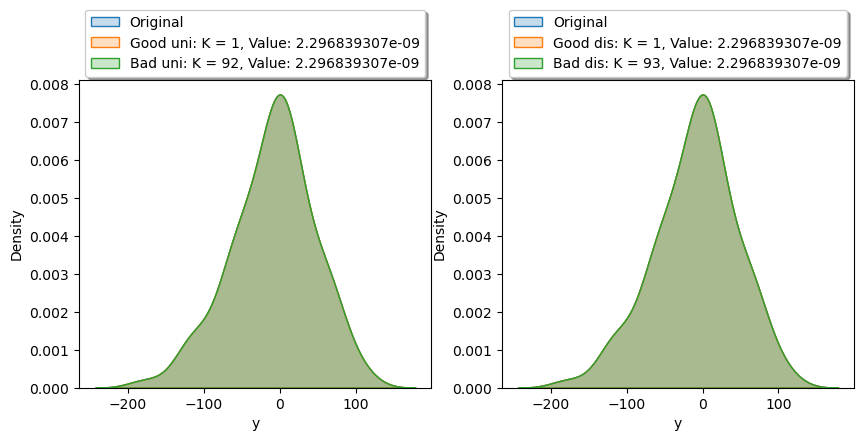

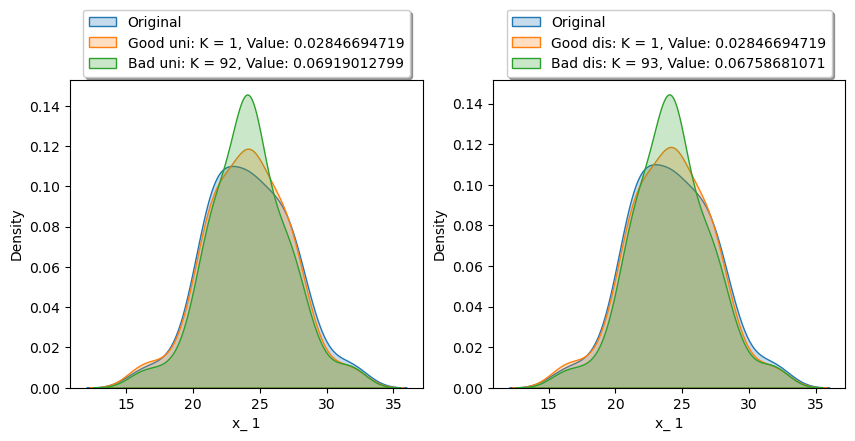

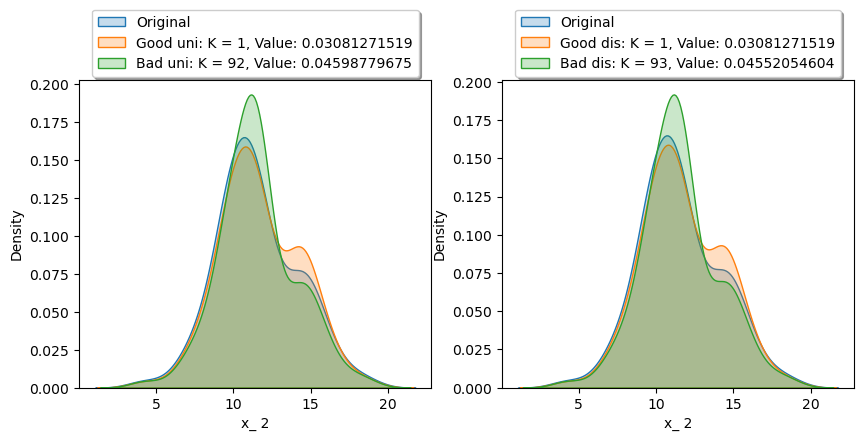

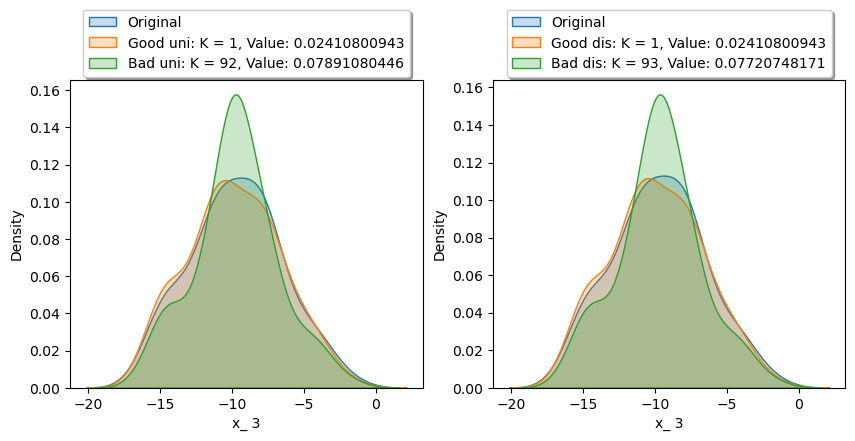

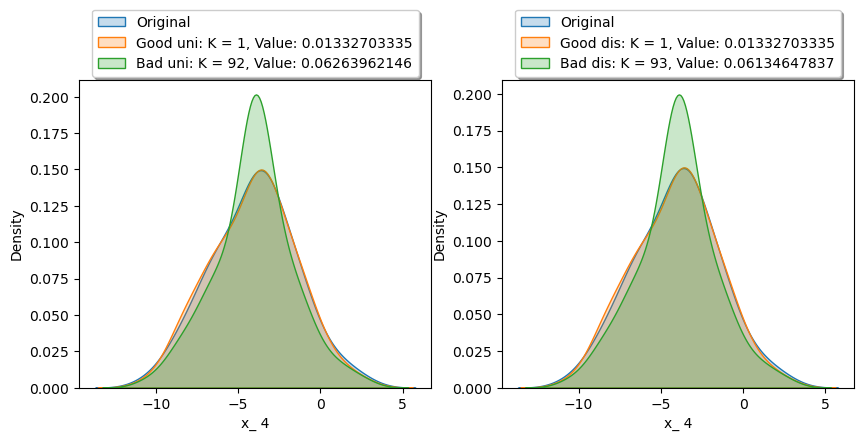

...

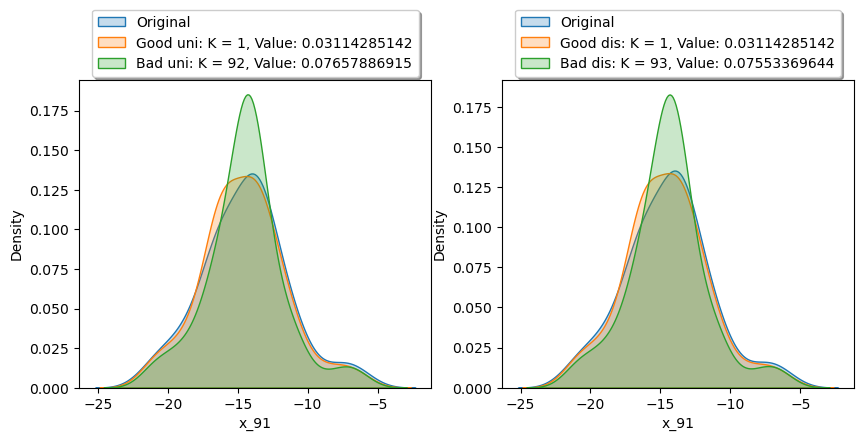

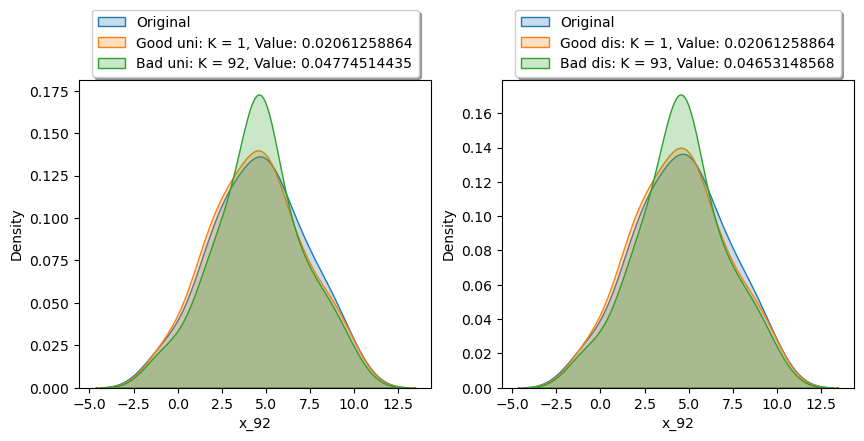

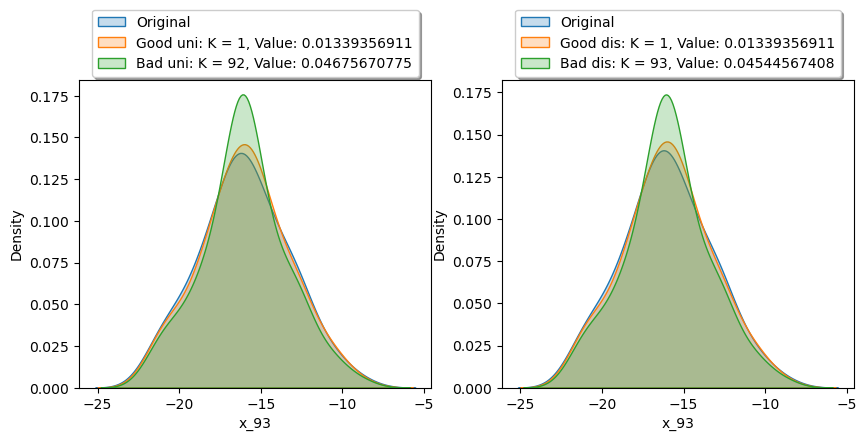

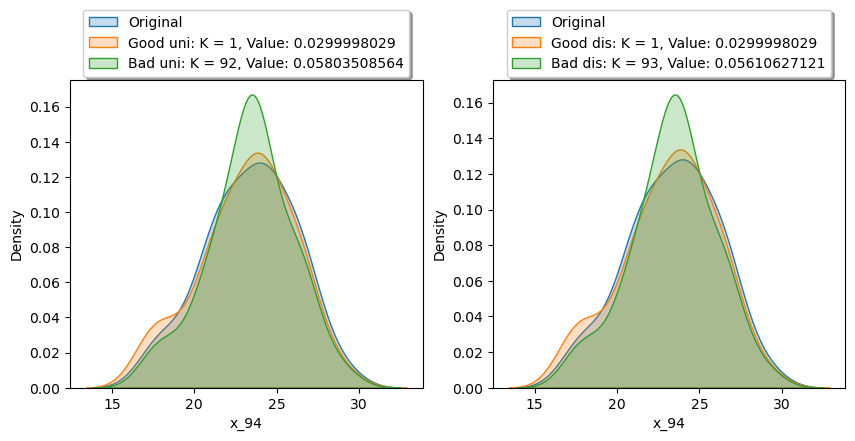

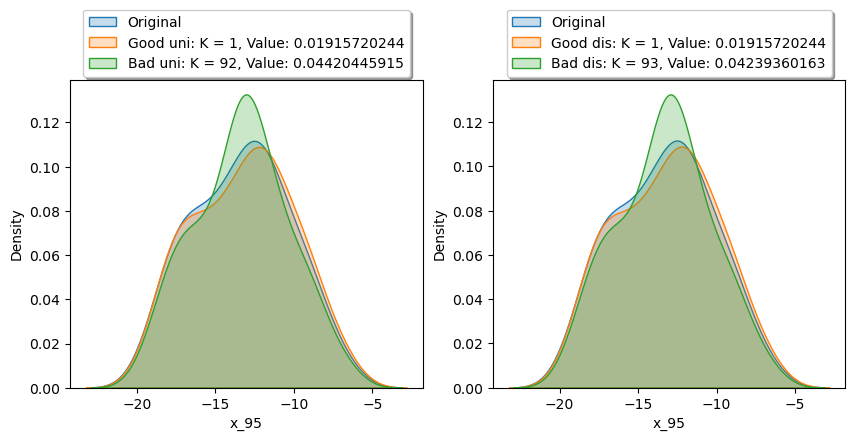

In [14]:
warnings.filterwarnings('ignore')
for col in data.columns[:96]:
    good_uni = compute_jensen_shannon_divergence(data[col], data_good_uni[col])
    bad_uni  = compute_jensen_shannon_divergence(data[col], data_bad_uni[col])
    good_dis = compute_jensen_shannon_divergence(data[col], data_good_dis[col])
    bad_dis  = compute_jensen_shannon_divergence(data[col], data_bad_dis[col])
    
    fig, ax = plt.subplots(1, 2, figsize =(10,4))
    
    sns.kdeplot(data[col], fill=True, label='Original', ax=ax[0])
    sns.kdeplot(data_good_uni[col], fill=True, label=f'Good uni: K = {num_good_uni:.3g}, Value: {good_uni:.10g}', ax=ax[0])
    sns.kdeplot(data_bad_uni[col], fill=True, label=f'Bad uni: K = {num_bad_uni:.3g}, Value: {bad_uni:.10g}', ax=ax[0])
    ax[0].set_title('Uniform knn')
    ax[0].set_xlabel(col)
    ax[0].set_ylabel('Density')

    sns.kdeplot(data[col], fill=True, label='Original', ax=ax[1])
    sns.kdeplot(data_good_dis[col], fill=True, label=f'Good dis: K = {num_good_dis:.3g}, Value: {good_dis:.10g}', ax=ax[1])
    sns.kdeplot(data_bad_dis[col], fill=True, label=f'Bad dis: K = {num_bad_dis:.3g}, Value: {bad_dis:.10g}', ax=ax[1])
    ax[1].set_title('Distance knn')
    ax[1].set_xlabel(col)
    ax[1].set_ylabel('Density')
    

    ax[0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.25), fancybox=True, shadow=True, ncol=1)
    ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, 1.25), fancybox=True, shadow=True, ncol=1)
    
    plt.show()


## Iterative imputer

In [17]:
data_tot_itr = pd.concat([data.iloc[:,:96],data_knn_imputed.iloc[:, 96:]], axis=1)
data_tot_itr.iloc[:, 94:].head()

,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,26.197445,-9.913837,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,25.924603,-7.015803,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,24.293073,-14.795709,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,25.954304,-9.365574,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,22.611184,-17.240003,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [18]:
X = data_tot_itr.iloc[:, 1:]  
y = data_tot_itr.iloc[:, 0]  
X_itr = pd.DataFrame()
imputer = IterativeImputer()
X_itr = imputer.fit_transform(X)
X_itr = pd.DataFrame(X_itr, columns=X.columns)
X_itr.iloc[:, 94:].head()

,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,C_ 3_I,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,-9.913837,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,-7.015803,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-14.795709,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-9.365574,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,-17.240003,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [19]:
data_itr = pd.DataFrame()
data_itr_imputed = pd.concat([data['y'], X_itr], axis = 1)
data_itr = pd.concat([data['y'], X_itr], axis = 1)
data_itr.iloc[:,96:101] = data_itr_imputed.iloc[:,96:101].apply(replace_max_value, axis=1)
data_itr.iloc[:,94:].head()

,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,26.197445,-9.913837,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,25.924603,-7.015803,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,24.293073,-14.795709,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,25.954304,-9.365574,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,22.611184,-17.240003,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [20]:
data_itr_imputed.iloc[:,94:].head()

,x_94,x_95,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K,C_ 2_H,C_ 3_G,C_ 3_H,...,C_ 4_G,C_ 4_H,C_ 4_I,C_ 4_J,C_ 4_K,C_ 5_G,C_ 5_H,C_ 5_I,C_ 5_J,C_ 5_K
0,26.197445,-9.913837,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,25.924603,-7.015803,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,24.293073,-14.795709,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,25.954304,-9.365574,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,22.611184,-17.240003,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


## Average Imputer

In [21]:
warnings.filterwarnings('ignore')
data_avg = pd.DataFrame()
data_avg_imputed = pd.DataFrame()

# Beregn gennemsnittet af hvert element i de to dataframes
for column in data_itr.columns:
    data_avg[column] = (data_itr_imputed[column] + data_knn_imputed[column]) / 2
    data_avg_imputed = (data_itr_imputed[column] + data_knn_imputed[column]) / 2
    
data_avg.iloc[:,96:101] = data_avg.iloc[:,96:101].apply(replace_max_value, axis=1)
data_avg.iloc[:,96:101].head(10)

,C_ 1_G,C_ 1_H,C_ 1_I,C_ 1_J,C_ 1_K
0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0
5,0.0,0.0,1.0,0.0,0.0
6,0.0,0.0,0.0,1.0,0.0
7,1.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,1.0,0.0
9,0.0,0.0,0.0,1.0,0.0


## Original, Iterative and KNN imputer

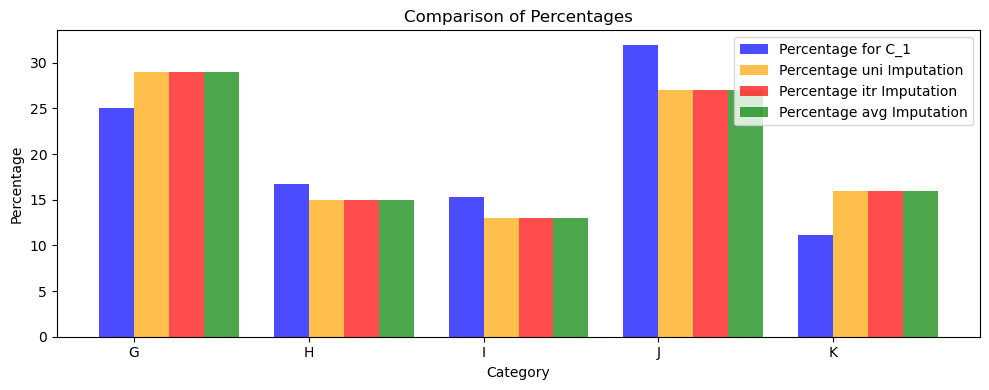

Sum of percentages for count_orginal: 100.0
Sum of percentages for count_uni: 100.0


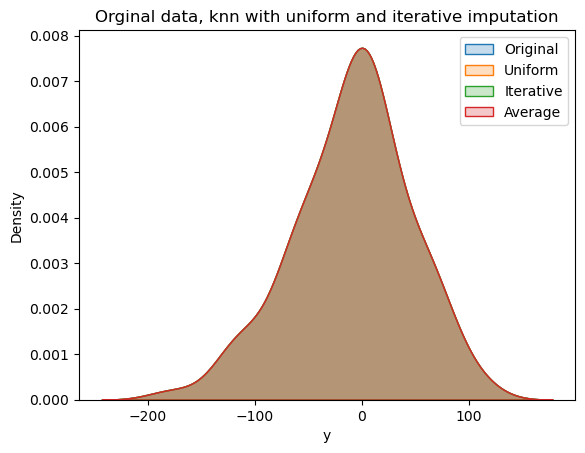

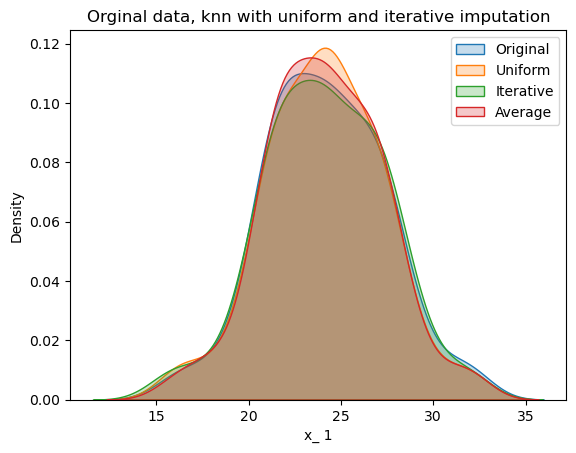

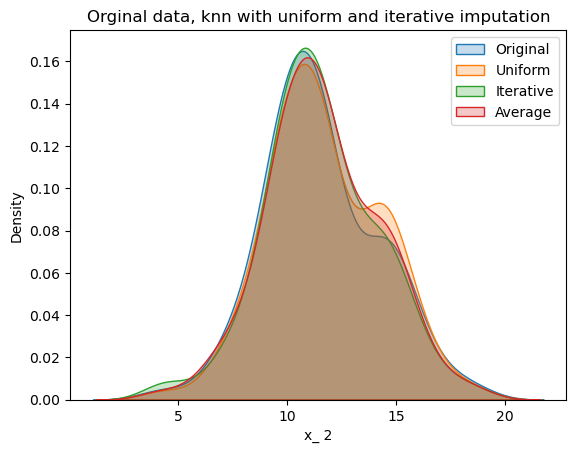

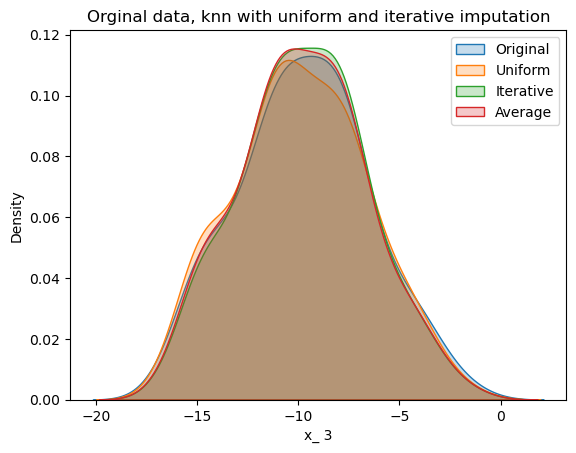

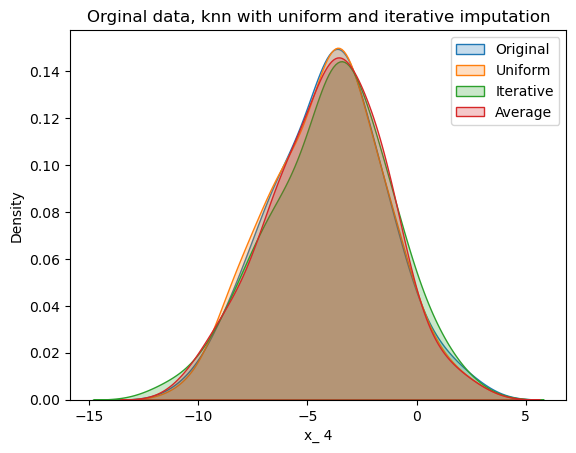

...

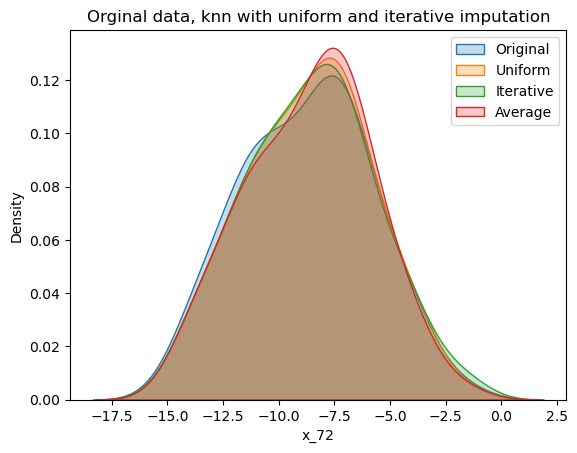

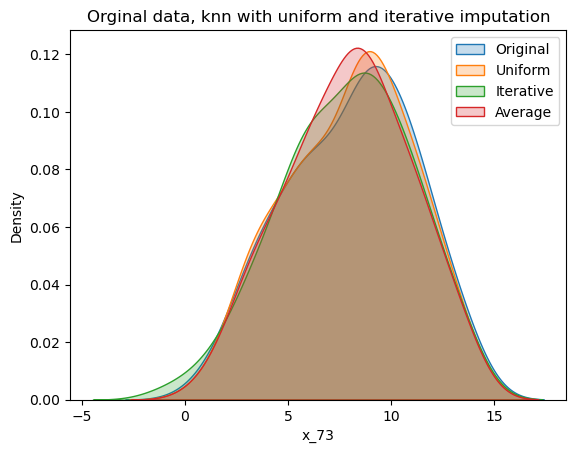

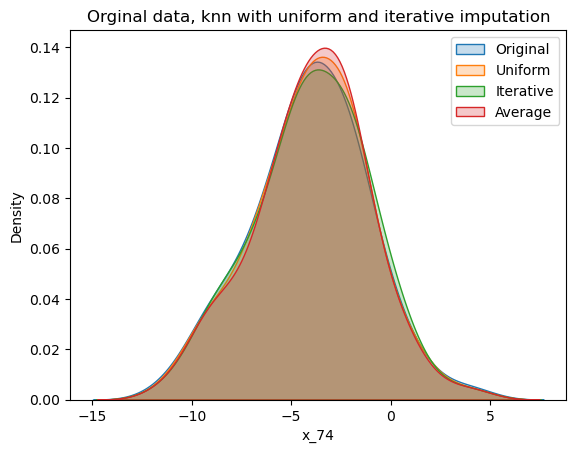

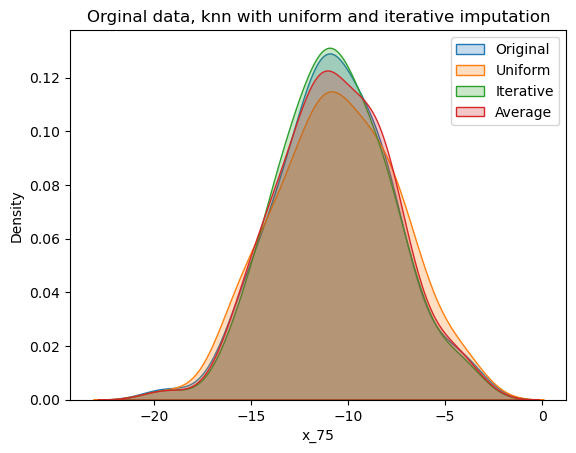

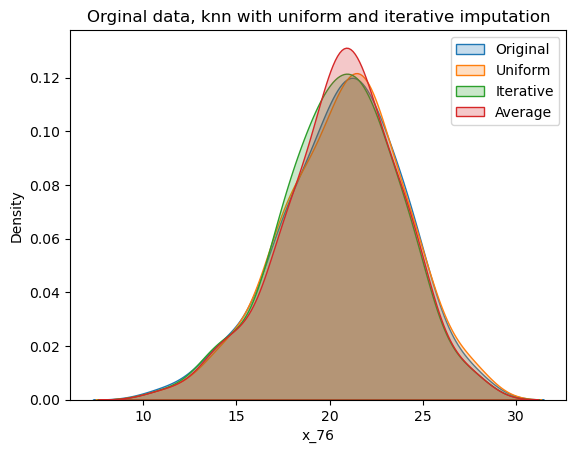

KeyboardInterrupt: 

In [23]:
warnings.filterwarnings('ignore')

count_orginal = data_cat['C_ 1'].value_counts(dropna=True)
count_uni = data_good_uni.iloc[:, 96:101].sum()
count_itr = data_itr.iloc[:, 96:101].sum()
count_avg = data_avg.iloc[:, 96:101].sum()

percentages_orginal = count_orginal / count_orginal.sum() * 100
percentages_uni = count_uni / count_uni.sum() * 100
percentages_itr = count_itr / count_itr.sum() * 100
percentages_avg = count_avg / count_avg.sum() * 100

percentages_orginal_sorted = percentages_orginal.sort_index()
percentages_uni_sorted = percentages_uni.sort_index()
percentages_itr_sorted = percentages_itr.sort_index()
percentages_avg_sorted = percentages_avg.sort_index()
index = np.arange(len(percentages_orginal_sorted))
bar_width = 0.2

plt.figure(figsize=(10, 4))

plt.bar(index, percentages_orginal_sorted, bar_width, color='blue', alpha=0.7, label='Percentage for C_1')
plt.bar(index + bar_width, percentages_uni_sorted, bar_width, color='orange', alpha=0.7, label='Percentage uni Imputation')
plt.bar(index + 2*bar_width, percentages_itr_sorted, bar_width, color='red', alpha=0.7, label='Percentage itr Imputation')
plt.bar(index + 3*bar_width, percentages_avg_sorted, bar_width, color='green', alpha=0.7, label='Percentage avg Imputation')

plt.title('Comparison of Percentages')
plt.xlabel('Category')
plt.ylabel('Percentage')
plt.xticks(index + bar_width / 2, percentages_orginal_sorted.index)
plt.legend()
plt.tight_layout()
plt.show()

print("Sum of percentages for count_orginal:", percentages_orginal.sum())
print("Sum of percentages for count_uni:", percentages_uni.sum())

plt.show()
for col in data.columns[:96]:

    sns.kdeplot(data[col], fill=True, label='Original')
    sns.kdeplot(data_good_uni[col], fill=True, label='Uniform')
    sns.kdeplot(data_itr[col], fill=True, label='Iterative')
    sns.kdeplot(data_avg[col], fill=True, label='Average')
    plt.title('Orginal data, knn with uniform and iterative imputation')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    
    plt.show()

## Iterative og KNN imputer